# **Lab5.1 : CNN Feature maps**

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
from torch import nn
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms


## Get VGG16 Pretrained model
Explore the VGG16 achitecture.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

```
VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (17): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (18): ReLU(inplace=True)
    (19): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (20): ReLU(inplace=True)
    (21): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (22): ReLU(inplace=True)
    (23): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (24): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (25): ReLU(inplace=True)
    (26): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (27): ReLU(inplace=True)
    (28): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (29): ReLU(inplace=True)
    (30): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(7, 7))
  (classifier): Sequential(
    (0): Linear(in_features=25088, out_features=4096, bias=True)
    (1): ReLU(inplace=True)
    (2): Dropout(p=0.5, inplace=False)
    (3): Linear(in_features=4096, out_features=4096, bias=True)
    (4): ReLU(inplace=True)
    (5): Dropout(p=0.5, inplace=False)
    (6): Linear(in_features=4096, out_features=1000, bias=True)
  )
)
```

</details>


In [2]:
### START CODE HERE ###
vgg16 = models.vgg16(pretrained=True)
print(vgg16)

### END CODE HERE ###

c:\Users\sitth\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\sitth\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

Explore all layers in feature extractor part.
[Read more.](https://pytorch.org/docs/stable/generated/torch.nn.Module.html#torch.nn.Module.named_modules:~:text=named_modules(memo%3DNone%2C%20prefix%3D%27%27%2C%20remove_duplicate%3DTrue))


<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

```
-------------------
0:Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
1:ReLU(inplace=True)
-------------------
2:Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
3:ReLU(inplace=True)
-------------------
4:MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
...
28:Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
29:ReLU(inplace=True)
-------------------
30:MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
```

</details>


In [3]:
### START CODE HERE ###
print("-------------------")
for idx,m in enumerate(vgg16.features):
    print(f"{idx}:{m}")
    print("-------------------")
### END CODE HERE ###    

-------------------
0:Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
1:ReLU(inplace=True)
-------------------
2:Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
3:ReLU(inplace=True)
-------------------
4:MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
-------------------
5:Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
6:ReLU(inplace=True)
-------------------
7:Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
8:ReLU(inplace=True)
-------------------
9:MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
-------------------
10:Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
11:ReLU(inplace=True)
-------------------
12:Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
-------------------
13:ReLU(inplace=True)
-------------------
14

Examine weight and bias of first Convolution layer and ReLU layer. [Read more.](https://pytorch.org/tutorials/beginner/introyt/modelsyt_tutorial.html)
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

```
torch.Size([64, 3, 3, 3])
Kernel : 0
*************************************
Channel : 0
[[-0.5537306   0.1427047   0.5289615 ]
 [-0.58312404  0.35655147  0.76566225]
 [-0.69022113 -0.04801885  0.48409155]]
Min coefficients -0.69022113
-------------------------------------
Channel : 1
[[ 0.17548391  0.00986297 -0.08141315]
 [ 0.04408892 -0.07032251 -0.26035076]
 [ 0.13239175 -0.1727862  -0.1322633 ]]
Min coefficients -0.26035076
-------------------------------------
Channel : 2
[[ 0.31302562 -0.1659134  -0.42752257]
 [ 0.47518674 -0.08267727 -0.48699915]
 [ 0.63202524  0.01930757 -0.2775303 ]]
Min coefficients -0.48699915
-------------------------------------


Kernel : 1
*************************************
Channel : 0
[[ 0.23253721  0.12665984  0.1860546 ]
 [-0.42805314 -0.24348575  0.24628444]
 [-0.2506616   0.14177004 -0.0054864 ]]
Min coefficients -0.42805314
-------------------------------------
Channel : 1
[[-0.14076217 -0.21902554  0.15040672]
 [-0.84126675 -0.3517562   0.5639763 ]
 [-0.24194452  0.5192758   0.5391499 ]]
Min coefficients -0.84126675
-------------------------------------
Channel : 2
[[-0.31432396 -0.37047786 -0.13093661]
 [-0.47144184 -0.15503426  0.3458899 ]
 [ 0.05438393  0.5868277   0.49579924]]
Min coefficients -0.47144184
-------------------------------------

...
```

</details>

In [99]:
### START CODE HERE ###
#จะได้ Node แรก คือ Conv
first_conv = vgg16.features[0]
#จะได้ Node ถัดไป คือ Relu
first_relu = vgg16.features[1]

#เอาค่า Weight และ Bias ออกมาจาก Conv แรก
weights = first_conv.weight.data
biases = first_conv.bias.data
print(weights.shape)

num_kernels_to_inspect = weights.shape[0]
for kernel_idx in range(num_kernels_to_inspect):
    print(f"\nKernel : {kernel_idx}")
    print("*************************************")
    for channel_idx in range(3):  #RGB มี 3 channel
        print(f"Channel : {channel_idx}")
        #ส่องดูแต่ละ Kernel ของแต่ละ Channel
        kernel_channel = weights[kernel_idx, channel_idx, :, :]
        print(kernel_channel)
        #minimum coefficient ของ channel นี้
        min_coeff = torch.min(kernel_channel)
        print(f"Min coefficients {min_coeff.item()}")
        print("-------------------------------------")
### END CODE HERE ###

tensor([ 0.4034,  0.3778,  0.4644, -0.3228,  0.3940, -0.3953,  0.3951, -0.5496,
         0.2693, -0.7602, -0.3508,  0.2334, -1.3239, -0.1694,  0.3938, -0.1026,
         0.0460, -0.6995,  0.1549,  0.5628,  0.3011,  0.3425,  0.1073,  0.4651,
         0.1295,  0.0788, -0.0492, -0.5638,  0.1465, -0.3890, -0.0715,  0.0649,
         0.2768,  0.3279,  0.5682, -1.2640, -0.8368, -0.9485,  0.1358,  0.2727,
         0.1841, -0.5325,  0.3507, -0.0827, -1.0248, -0.6912, -0.7711,  0.2612,
         0.4033, -0.4802, -0.3066,  0.5807, -1.3325,  0.4844, -0.8160,  0.2386,
         0.2300,  0.4979,  0.5553,  0.5230, -0.2182,  0.0117, -0.5516,  0.2108])
torch.Size([64, 3, 3, 3])

Kernel : 0
*************************************
Channel : 0
tensor([[-0.5537,  0.1427,  0.5290],
        [-0.5831,  0.3566,  0.7657],
        [-0.6902, -0.0480,  0.4841]])
Min coefficients -0.6902211308479309
-------------------------------------
Channel : 1
tensor([[ 0.1755,  0.0099, -0.0814],
        [ 0.0441, -0.0703, -0.2604]

In [5]:
assert isinstance(first_conv, nn.Conv2d), "First layer should be a convolutional layer"
assert isinstance(first_relu, nn.ReLU), "Second layer should be a ReLU activation"
assert first_conv.weight.shape == (64, 3, 3, 3), "First layer weight shape should be (64, 3, 3, 3)"

Examine Biases
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

```
Bias : Parameter containing:
tensor([ 0.4034,  0.3778,  0.4644, -0.3228,  0.3940, -0.3953,  0.3951, -0.5496,
         ...
         0.2300,  0.4979,  0.5553,  0.5230, -0.2182,  0.0117, -0.5516,  0.2108],
       requires_grad=True)
```

</details>

In [6]:
### START CODE HERE ###
#จัด Format ตามโจทย์เฉยๆ จริงๆแค่เอา biases มาก็พอแล้ว
print("Bias : Parameter containing:")
if not biases.requires_grad:
    biases.requires_grad_()
print(f"tensor({biases.tolist()}, requires_grad={biases.requires_grad})")
### END CODE HERE ###

Bias : Parameter containing:
tensor([0.40338799357414246, 0.3777942359447479, 0.4643615782260895, -0.32276368141174316, 0.39395564794540405, -0.3953235149383545, 0.3950970470905304, -0.5495690703392029, 0.26928654313087463, -0.7602193355560303, -0.3507794439792633, 0.23343612253665924, -1.3239450454711914, -0.16935062408447266, 0.39379027485847473, -0.10257558524608612, 0.04603290930390358, -0.6995018720626831, 0.15494802594184875, 0.5628073811531067, 0.3011382520198822, 0.34252938628196716, 0.10733295977115631, 0.46505284309387207, 0.12947751581668854, 0.07882677018642426, -0.04919179901480675, -0.5637744069099426, 0.14650948345661163, -0.38904887437820435, -0.07145468890666962, 0.06487961858510971, 0.27682530879974365, 0.3279474079608917, 0.5682369470596313, -1.2640222311019897, -0.8368082642555237, -0.9484993815422058, 0.13577120006084442, 0.2726755142211914, 0.18407875299453735, -0.5325408577919006, 0.35074225068092346, -0.08268310874700546, -1.024826169013977, -0.6911686658859253,

## Process the feature maps
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

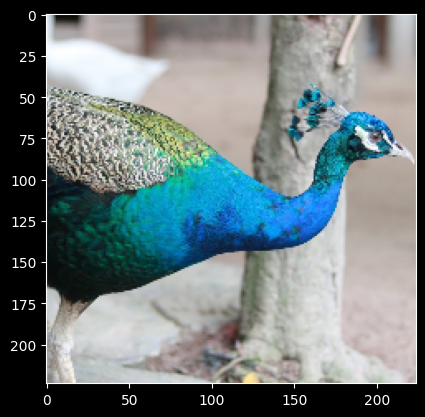

</details>

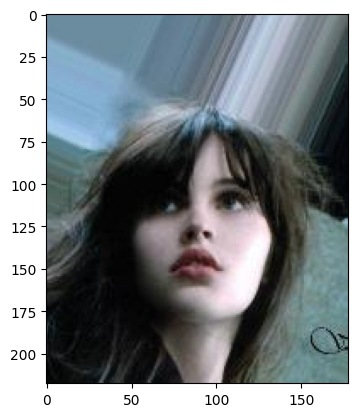

In [7]:
### START CODE HERE ###
img = plt.imread("data/img_align_celeba/000374.jpg")
plt.imshow(img)


### END CODE HERE ###

Normalize the image using the mean and standard deviation values from the [VGG16 normalization parameters.](https://pytorch.org/vision/main/models/generated/torchvision.models.vgg16.html)
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

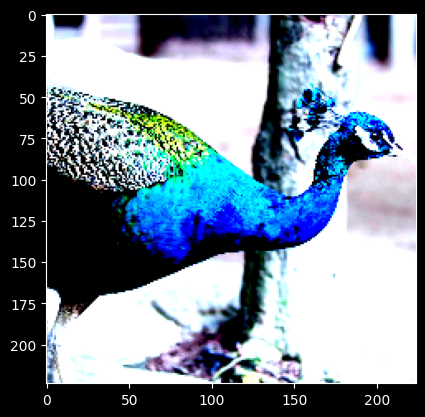

</details>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


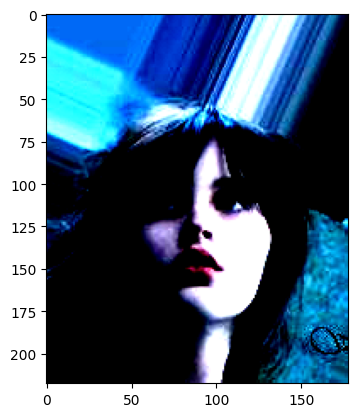

In [81]:
### START CODE HERE ###
# VGG16 normalization parameters
mean = [0.485, 0.456, 0.406] #เอาค่ามาจาก Web
std = [0.229, 0.224, 0.225]

#กำหนดค่าสำหรับ normalization transform
normalize = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

#ทำ normalization
img_tensor = normalize(img)
img_tensor = img_tensor.permute(1, 2, 0)  # (C, H, W) --> (H, W, C)
plt.imshow(img_tensor)


### END CODE HERE ###

Convert the [NumPy image to a PyTorch tensor](https://pytorch.org/docs/stable/torch.html#:~:text=memory%2Dmapped%20file.-,from_numpy,-Creates%20a%20Tensor), ensuring it has the [correct dimensions and data type](https://pytorch.org/vision/main/models/generated/torchvision.models.vgg16.html) for input to the first convolution layer.

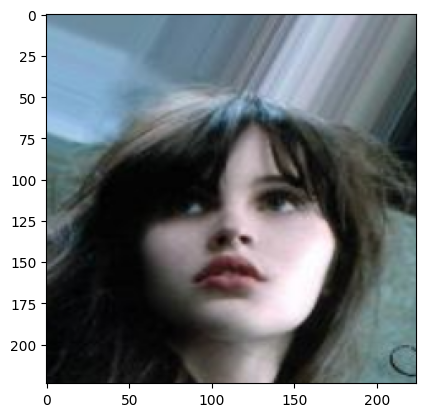

In [87]:
### START CODE HERE ###

#numpy array
img_np = img

# Check if the image is grayscale and convert it to RGB
if len(img_np.shape) == 2 or img_np.shape[2] == 1:
    img_np = cv2.cvtColor(img_np, cv2.COLOR_GRAY2RGB)

#Resize และ crop
def resize_and_crop(img, size=256, crop_size=224):
    # Resize image
    img_resized = cv2.resize(img, (size, size))
    
    # Calculate center crop
    center = (size // 2, size // 2)
    x1 = center[0] - crop_size // 2
    y1 = center[1] - crop_size // 2
    x2 = center[0] + crop_size // 2
    y2 = center[1] + crop_size // 2
    
    # Crop image
    img_cropped = img_resized[y1:y2, x1:x2]
    return img_cropped

img_cropped = resize_and_crop(img_np)

plt.imshow(img_cropped)
preprocess = transforms.Compose([
    transforms.ToTensor(),  # Convert image to tensor and scale to [0, 1]
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

# Apply the preprocessing
img_tensor = preprocess(img_cropped)
### END CODE HERE ###

Complete the function below. <br>
The plot_featuremap function takes a set of feature maps and creates a grid of subplots, each displaying a single feature map. 

In [88]:
### START CODE HERE ###
def plot_featuremap(img, title="Feature Maps"):
    fig = plt.figure(figsize=(30, 50))
    fig.suptitle(title, fontsize=30)
    
    # Calculate grid size based on the number of images
    num_images = len(img)
    grid_size = int(np.ceil(np.sqrt(num_images)))

    for i in range(num_images):
        a = fig.add_subplot(grid_size, grid_size, i + 1)
        plt.imshow(img[i], cmap='gray')
        a.axis("off")
        a.set_title(i+1, fontsize=30)

    plt.tight_layout()
    plt.show()
### END CODE HERE ###

Pass the image to the first convolutional layer and display the feature map output using your `plot_featuremap()` function.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

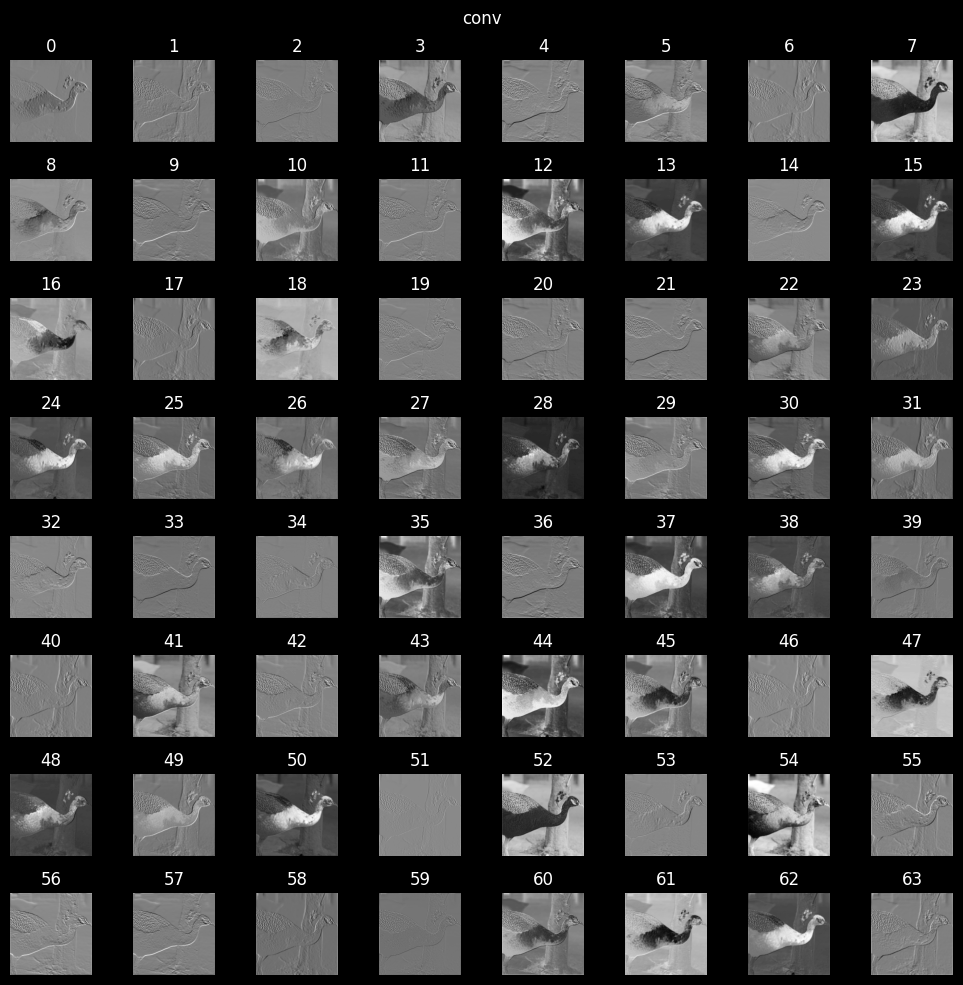
</details>

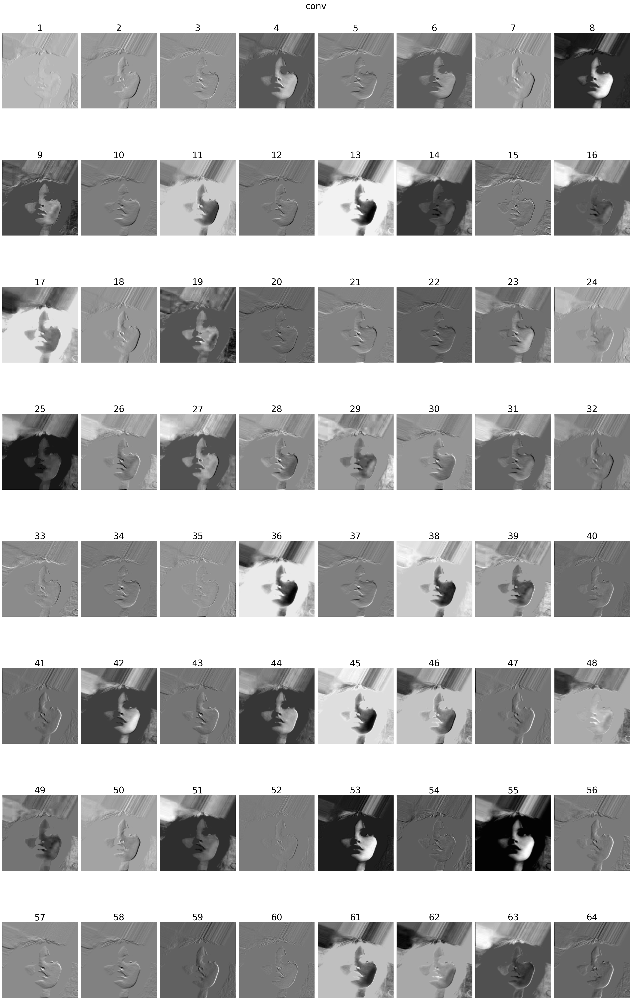

In [95]:
### START CODE HERE ###
with torch.no_grad():  # Disable gradient calculation
    feature_map_conv = first_conv(img_tensor)
# Plot the feature maps using the plot_featuremap function
plot_featuremap(feature_map_conv, title="conv")

### END CODE HERE ###

Pass the image to the first ReLU layer and display the feature map output using your `plot_featuremap()` function.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

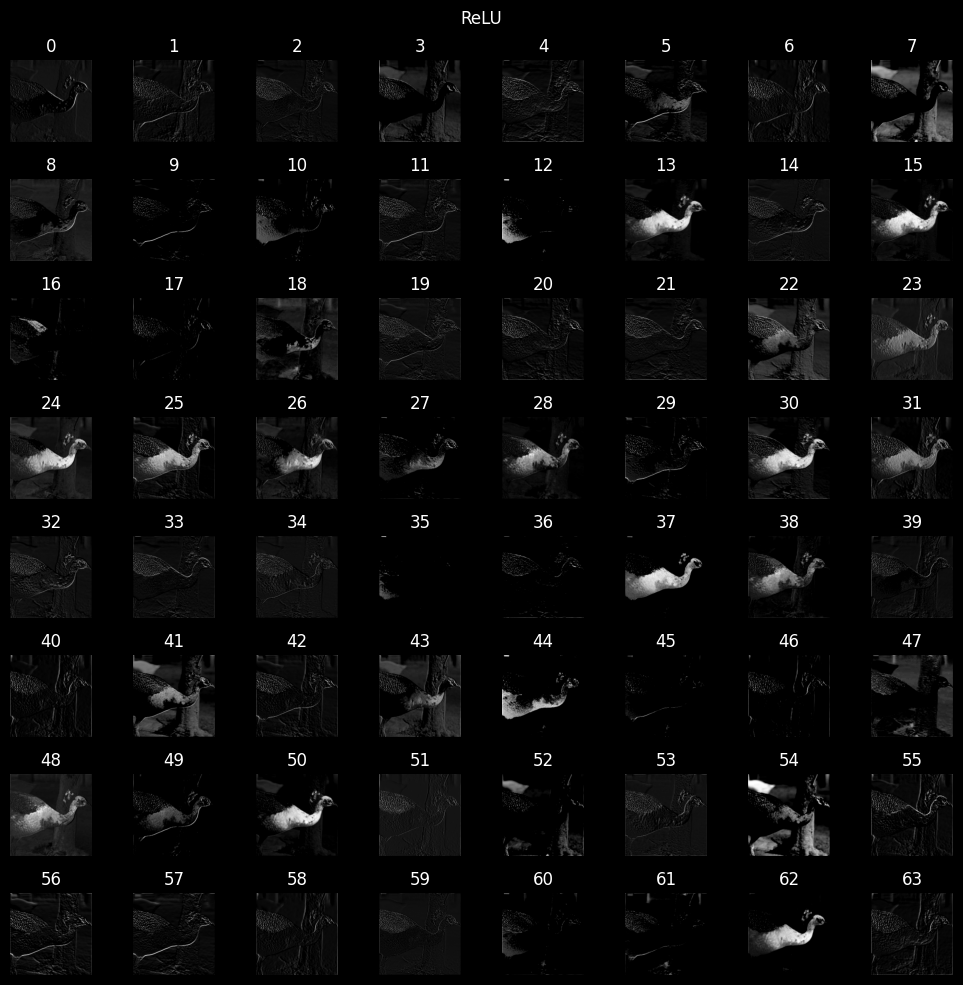

</details>

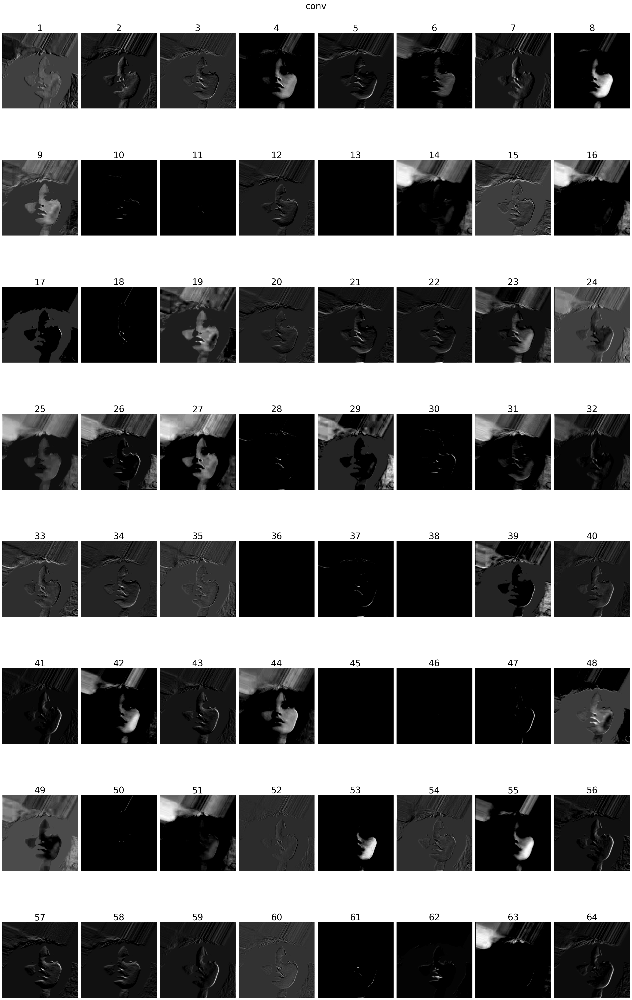

In [96]:
### START CODE HERE ###
with torch.no_grad():  # Disable gradient calculation
    feature_map_relu = first_relu(feature_map_conv)
# Squeeze the batch dimension and convert to numpy for visualization


# Plot the feature maps using the plot_featuremap function
plot_featuremap(feature_map_relu, title="conv")


### END CODE HERE ###

## Convolution 2D from scratch
Complete the function below

In [114]:
### START CODE HERE ###
def convolution2d(img, kernel, padding=0, stride=1):
    # Check if the input image has 3 channels
    if img.ndim == 3 and img.shape[2] == 3:
        # Initialize the output for 3 channels
        output_r = np.zeros_like(img[:, :, 0])
        output_g = np.zeros_like(img[:, :, 1])
        output_b = np.zeros_like(img[:, :, 2])
        
        # Convolve each channel
        for c in range(3):
            img_channel = img[:, :, c]
            img_height, img_width = img_channel.shape
            kernel_height, kernel_width = kernel.shape

            if padding > 0:
                img_padded = np.pad(img_channel, ((padding, padding), (padding, padding)), mode='constant', constant_values=0)
            else:
                img_padded = img_channel
            
            padded_height, padded_width = img_padded.shape
            output_height = (padded_height - kernel_height) // stride + 1
            output_width = (padded_width - kernel_width) // stride + 1
            
            output = np.zeros((output_height, output_width))
            
            # Apply the kernel to the image
            for y in range(0, output_height):
                for x in range(0, output_width):
                    region = img_padded[y*stride:y*stride+kernel_height, x*stride:x*stride+kernel_width]
                    output[y, x] = np.sum(region * kernel)
            
            # Assign to the corresponding channel output
            if c == 0:
                output_r = output
            elif c == 1:
                output_g = output
            elif c == 2:
                output_b = output

        # Combine the channel outputs (e.g., average)
        output = (output_r + output_g + output_b) / 3

    else:
        # Handle grayscale image
        img_height, img_width = img.shape
        kernel_height, kernel_width = kernel.shape

        if padding > 0:
            img_padded = np.pad(img, ((padding, padding), (padding, padding)), mode='constant', constant_values=0)
        else:
            img_padded = img
        
        padded_height, padded_width = img_padded.shape
        output_height = (padded_height - kernel_height) // stride + 1
        output_width = (padded_width - kernel_width) // stride + 1
        
        output = np.zeros((output_height, output_width))
        
        # Apply the kernel to the image
        for y in range(0, output_height):
            for x in range(0, output_width):
                region = img_padded[y*stride:y*stride+kernel_height, x*stride:x*stride+kernel_width]
                output[y, x] = np.sum(region * kernel)

    return output
### END CODE HERE ###

Copy the weights and biases from `vgg16` and then use each kernel perform a 2D convolution using `convolution2d` and display the resulting feature map
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

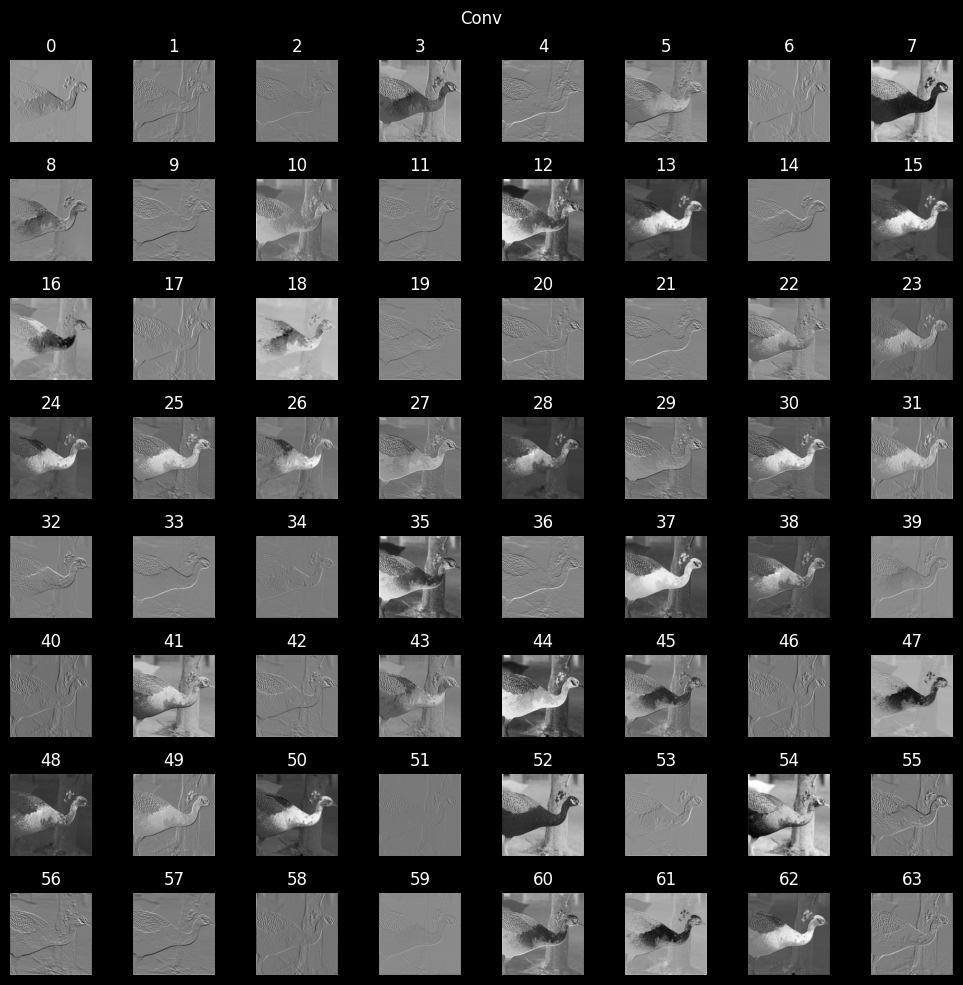

</details>

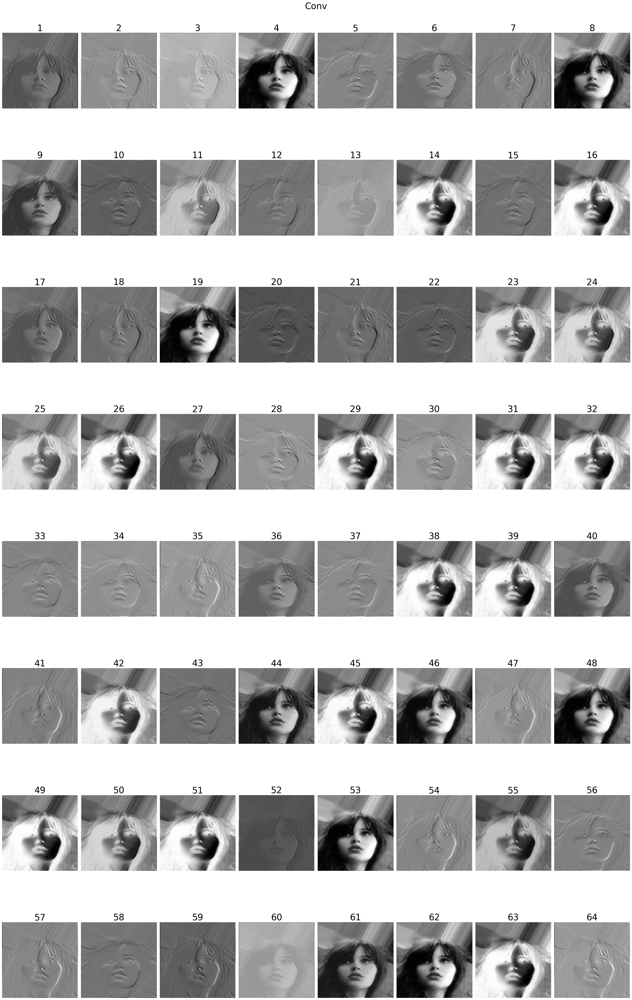

In [116]:
### START CODE HERE ###
weights = first_conv.weight.data.numpy()
biases = first_conv.bias.data.numpy()
# ทำ convolutions
feature_maps = []
for i in range(weights.shape[0]):  # Iterate through all filters
    kernel = weights[i, 0]  # Get the i-th 2D kernel
    feature_map = convolution2d(img_cropped, kernel, padding=1, stride=1)
    feature_maps.append(feature_map)

plot_featuremap(feature_maps, title="Conv")
### END CODE HERE ###

After performing the `convolution2d` operation, apply the ReLU activation function to the output. Then, display the resulting feature map.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

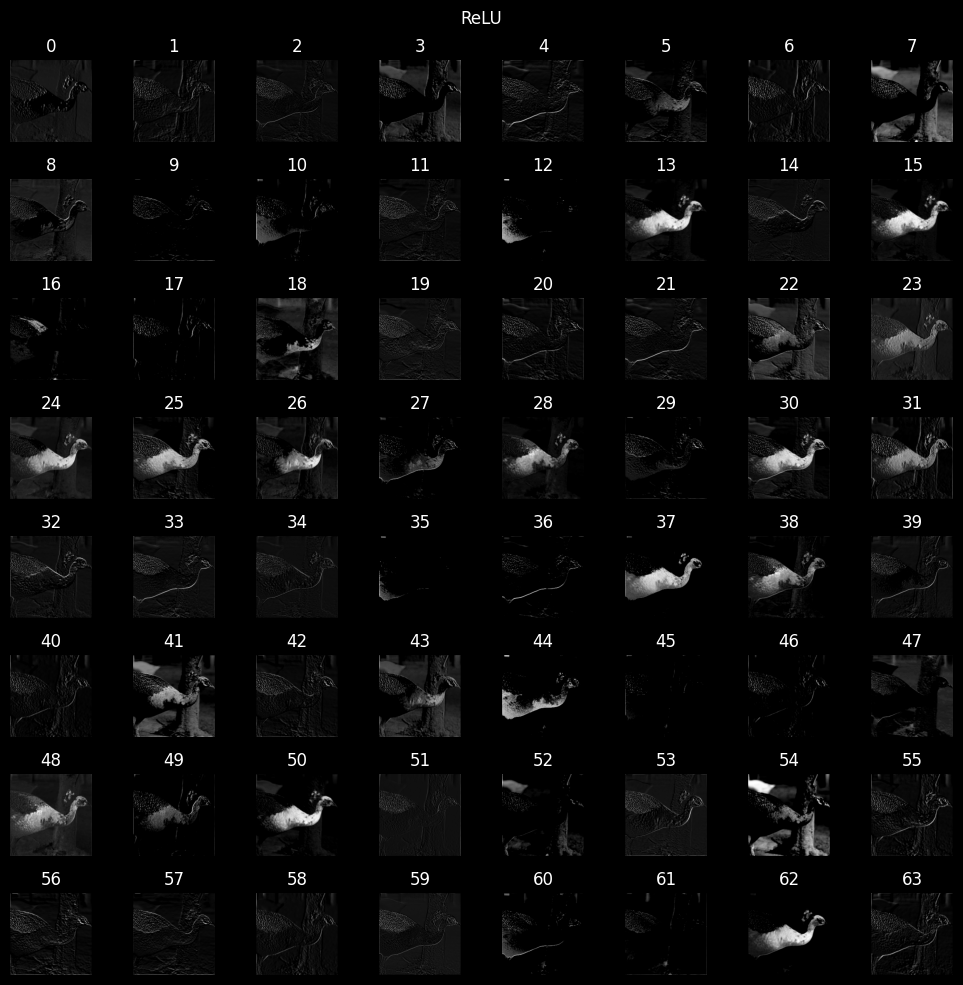

</details>

In [ ]:
### START CODE HERE ###



### END CODE HERE ###

---

# Question
1. Show the array of kernel weights used for extracting object color 
and those used for extracting object edge details at least two CNN nodes.
Compare and Discuss how the specific values of these kernel weights influence the CNN's ability 
to detect colors versus edges in images.
2. Why is Matplotlib able to display the output feature map from the convolution layer, even though it contains negative values?
3. Is there a method faster than traditional 2D convolution in the "Convolution 2D from scratch" section?